# Train Similarity Search Algorithm

This notebook trains a model on the previously extracted image features which will search for the most similar image



In [6]:
import os
import sys
import pandas as pd
import numpy as np
import csv
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from joblib import dump, load


In [8]:
sys.path.append('../src')
import utils

In [9]:
def get_feature_extractor_notes(features_serial_num):
    
    fname = 'features_notes_{}.txt'.format(features_serial_num)
    fldr_path = os.path.join('..', 'data','processed')
    fpath = os.path.join(fldr_path, fname)

    with open(fpath,'r') as f:
        features_notes = f.readlines()
    
    return features_notes

In [10]:
def save_model_notes(clf, model_fldr=None):    
    
    if not model_fldr:
        model_fldr = os.path.join('..','models','search', clf.serial_num)

    # write model params to notes file
    fpath = os.path.join(model_fldr, "notes.txt") 

    #get notes about features
    try:
        feature_notes = get_feature_extractor_notes(clf.features_file_serial_num)
    except:
        print("Error: could not load feature notes")
        feature_notes = None

    #write to file
    with open(fpath,'w') as f:

        # write feature extractor notes
        if feature_notes:
            for i, line in enumerate(feature_notes):
                if i==0:
                    line = "Feature_Extraction_" + line
                f.write(line)
        # write search algorithm notes
        f.write("features_file_serial_num: {}\n".format(clf.features_file_serial_num))
        f.write("search_algorithm_name: {}\n".format(clf.name))
        for k,v in clf.get_params().items():    
            f.write("{}: {}\n".format(k,v))
    
    print("saved model params to: {}".format(fpath))
    
    return

In [11]:
def save_model_and_notes(clf):
    """
    serialize a scikit learn classifier and save to file
    save assosciated classifier notes to the same folder
    """
    # make folder
    model_fldr = os.path.join("..","models","search",str(clf.serial_num))

    if not os.path.exists(model_fldr):
        os.makedirs(model_fldr)

    save_model_notes(clf, model_fldr)
    
    # serialize (save) model
    fname = '{}.joblib'.format(clf.name)
    fpath = os.path.join(model_fldr,fname)
    clf_fpath = dump(clf, fpath)
    clf_fpath = clf_fpath[0]
    
    print("saved model to: {}".format(clf_fpath))
    
    return clf_fpath

In [12]:
def init_and_fit_nearest_neighbours(features_list, 
                                    features_serial_num,
                                    n_neighbours=10,
                                    algorithm='brute',
                                    metric='euclidean'):

    clf_name = 'NearestNeighbors{}'.format(n_neighbours) 
    clf = NearestNeighbors(n_neighbors=n_neighbours, 
                           algorithm=algorithm, 
                           metric=metric)

    # add additional attributes to model
    timestamp = utils.time_stamp()
    clf.name = clf_name
    clf.serial_num = timestamp
    clf.features_file_serial_num = features_serial_num

    #fit model
    clf = clf.fit(features_list)
    
    return clf

In [13]:

def plot_similar_images(j, df, labels, features_list, clf, clf_func, show_plots=True, save_figures=False):
    """
    j: index (of labels list) to look up
    df: df with image metadata
    labels: true labels. list with the object ids for all the images
    features_list: list of numpy arrays with the extracted features
    """
    
    # look up true image
    true_label = labels[j]
    true_metadata = df.loc[true_label,:]

    # look up similar images
    distances, indices = clf_func([features_list[j]])
    object_ids = labels[indices.tolist()[0]]
    tdf = df.loc[object_ids,:]

    # plot results
    num_plots = min(tdf.shape[0], 10)
    fig, axs = plt.subplots(nrows=1+num_plots,ncols=1,figsize=(8,int(num_plots*4)))

    # show true image
    axs[0].set_title('original image: ' + true_metadata['title'], fontdict={'fontweight' : 750} )
    # axs[0].axis('off')
    im = plt.imread(true_metadata['img_path'])
    axs[0].imshow(im)
    axs[0].spines['bottom'].set_visible(True)
    axs[0].spines['bottom'].set_linewidth(3)

    # show similar images
    for i, (idx, row) in enumerate(tdf.iterrows()):

        axs[i+1].set_title(str(i+1) + ': ' + row['title'])
        im = plt.imread(row['img_path'])
        axs[i+1].axis('off')
        axs[i+1].imshow(im)

    for ax in axs:
        ax.set_xticks([])
        ax.set_yticks([])

    for sp_name in axs[0].spines:

        axs[0].spines[sp_name].set_visible(True)
        axs[0].spines[sp_name].set_linewidth(3)

    fig.tight_layout()
    if show_plots:
        plt.show()
    
    if save_figures:
        fldr = os.path.join("..","models","search", clf.serial_num, "test_images")
        if not os.path.exists(fldr):
            os.makedirs(fldr)
            
        fig_fname = '{}: {}.png'.format(j, true_metadata['title'])
        fig_fpath= os.path.join(fldr, fig_fname)
        fig.savefig(fig_fpath)
        
    _ = [print(str(i+1),': ', row['detail_url']) for i, (idx, row) in enumerate(tdf.iterrows())]
    
    return object_ids, true_metadata

# Load Data

In [14]:
features_serial_num = "202101182225" # vgg16:"202101182225", resnet50:"202010131412" resnet50V2:"202010131713"
features_filename = 'features_{}.csv'.format(features_serial_num)
labels, features_list  = utils.load_features(fname=features_filename)

In [15]:
labels[:5]

array([18, 19, 33, 52, 57])

# Train Classifier

In [16]:
clf = init_and_fit_nearest_neighbours(features_list, 
                                    features_serial_num,
                                    n_neighbours=10,
                                    algorithm='brute',
                                    metric='euclidean')

In [17]:
clf.labels = labels

In [18]:
clf.labels

array([   18,    19,    33, ..., 53477, 53478, 53479])

In [19]:
# Save model
clf_fpath = save_model_and_notes(clf)

Error: could not load feature notes
saved model params to: ../models/search/202101190848/notes.txt
saved model to: ../models/search/202101190848/NearestNeighbors10.joblib


In [20]:
# reload model
# clf_fpath = "../models/search/202010131714/NearestNeighbors10.joblib"
clf = load(clf_fpath)

In [21]:
clf.__dict__

{'n_neighbors': 10,
 'radius': 1.0,
 'algorithm': 'brute',
 'leaf_size': 30,
 'metric': 'euclidean',
 'metric_params': None,
 'p': 2,
 'n_jobs': None,
 'name': 'NearestNeighbors10',
 'serial_num': '202101190848',
 'features_file_serial_num': '202101182225',
 'effective_metric_params_': {},
 'effective_metric_': 'euclidean',
 'n_features_in_': 512,
 '_fit_method': 'brute',
 '_fit_X': array([[ 0.67259252, -0.65561777,  2.84734845, ..., -0.65561777,
          0.58462328, -0.65561777],
        [ 0.62978053, -0.5796839 , -0.26234993, ..., -0.5796839 ,
          0.70112306, -0.5796839 ],
        [ 0.64719081, -0.30140695,  3.26483011, ..., -0.66231704,
          0.22033559, -0.16726932],
        ...,
        [ 0.32447374, -0.53307784,  1.31122339, ..., -0.53307784,
          1.36779046, -0.53307784],
        [ 0.64272428, -0.47872585,  1.13669181, ..., -0.47872585,
          1.32559884, -0.47872585],
        [ 0.41563764, -0.47658941,  2.11200547, ..., -0.61164725,
          1.07415378, -0.6

# Test results

In [34]:
fpath = os.path.join('..','data','interim','graphik_portal_202101182225.csv')
df = pd.read_csv(fpath, index_col='object_id')
df.head()

,title,img_url,detail_url,detail_description,img_path
object_id,,,,,
3,Marcus Curtius stürzt sich in die Erdspalte,https://www.e-gs.ethz.ch/eMP/eMuseumPlus?servi...,https://www.graphikportal.org/document/gpo0021...,Monogrammist IB [Nagler III 1950] (Erwähnt um ...,../data/processed/images/0/3.png
18,Die Philister bringen die Bundeslade in den Te...,https://www.e-gs.ethz.ch/eMP/eMuseumPlus?servi...,https://www.graphikportal.org/document/gpo0021...,"Battista Franco (Um 1510 - 1561), Um 1525 - 1561",../data/processed/images/0/18.png
19,Der grosse Saal im Schloss in Prag [Linke Bild...,https://www.e-gs.ethz.ch/eMP/eMuseumPlus?servi...,https://www.graphikportal.org/document/gpo0021...,Egidius Sadeler (der Jüngere) (Um 1570 - 1629)...,../data/processed/images/0/19.png
33,Die schöne Försterin,https://www.e-gs.ethz.ch/eMP/eMuseumPlus?servi...,https://www.graphikportal.org/document/gpo0021...,"Henry Wyatt (1794 - 1840), nach, 1835, Francis...",../data/processed/images/0/33.png
52,Stigmatisation des heiligen Franziskus,https://www.e-gs.ethz.ch/eMP/eMuseumPlus?servi...,https://www.graphikportal.org/document/gpo0021...,"Agostino Carracci (1557 - 1602), Ca. 1583",../data/processed/images/0/52.png


In [35]:
test_ids = [500, 1000, 3000, 4500, 4567, 5555, 5678, 9000, 9992]

In [36]:
df.head()

,title,img_url,detail_url,detail_description,img_path
object_id,,,,,
3,Marcus Curtius stürzt sich in die Erdspalte,https://www.e-gs.ethz.ch/eMP/eMuseumPlus?servi...,https://www.graphikportal.org/document/gpo0021...,Monogrammist IB [Nagler III 1950] (Erwähnt um ...,../data/processed/images/0/3.png
18,Die Philister bringen die Bundeslade in den Te...,https://www.e-gs.ethz.ch/eMP/eMuseumPlus?servi...,https://www.graphikportal.org/document/gpo0021...,"Battista Franco (Um 1510 - 1561), Um 1525 - 1561",../data/processed/images/0/18.png
19,Der grosse Saal im Schloss in Prag [Linke Bild...,https://www.e-gs.ethz.ch/eMP/eMuseumPlus?servi...,https://www.graphikportal.org/document/gpo0021...,Egidius Sadeler (der Jüngere) (Um 1570 - 1629)...,../data/processed/images/0/19.png
33,Die schöne Försterin,https://www.e-gs.ethz.ch/eMP/eMuseumPlus?servi...,https://www.graphikportal.org/document/gpo0021...,"Henry Wyatt (1794 - 1840), nach, 1835, Francis...",../data/processed/images/0/33.png
52,Stigmatisation des heiligen Franziskus,https://www.e-gs.ethz.ch/eMP/eMuseumPlus?servi...,https://www.graphikportal.org/document/gpo0021...,"Agostino Carracci (1557 - 1602), Ca. 1583",../data/processed/images/0/52.png


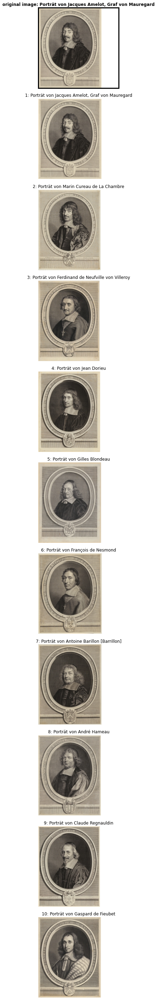

1 :  https://www.graphikportal.org/document/gpo00216062?medium=755214F
2 :  https://www.graphikportal.org/document/gpo00215753?medium=7592150
3 :  https://www.graphikportal.org/document/gpo00215214?medium=7512151
4 :  https://www.graphikportal.org/document/gpo00215522?medium=755214C
5 :  https://www.graphikportal.org/document/gpo00215532?medium=752214B
6 :  https://www.graphikportal.org/document/gpo00215923?medium=7612151
7 :  https://www.graphikportal.org/document/gpo00223231?medium=7662151
8 :  https://www.graphikportal.org/document/gpo00221717?medium=28DE2189
9 :  https://www.graphikportal.org/document/gpo00215550?medium=7512149
10 :  https://www.graphikportal.org/document/gpo00217074?medium=75F214E


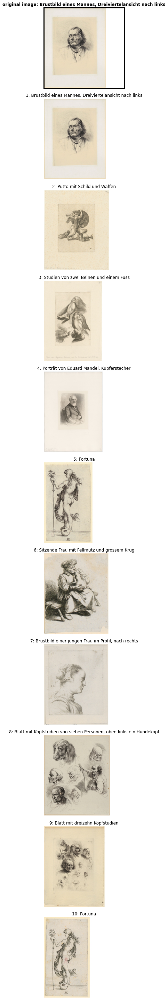

1 :  https://www.graphikportal.org/document/gpo00216210?medium=7642151
2 :  https://www.graphikportal.org/document/gpo00225660?medium=28EA2186
3 :  https://www.graphikportal.org/document/gpo00227143?medium=28CE2183
4 :  https://www.graphikportal.org/document/gpo00215074?medium=E60A2120
5 :  https://www.graphikportal.org/document/gpo00221251?medium=28D72183
6 :  https://www.graphikportal.org/document/gpo00222377?medium=28E22187
7 :  https://www.graphikportal.org/document/gpo00218834?medium=28BC2179
8 :  https://www.graphikportal.org/document/gpo00217384?medium=76E2158
9 :  https://www.graphikportal.org/document/gpo00216626?medium=74F2146
10 :  https://www.graphikportal.org/document/gpo00220129?medium=28C8217F


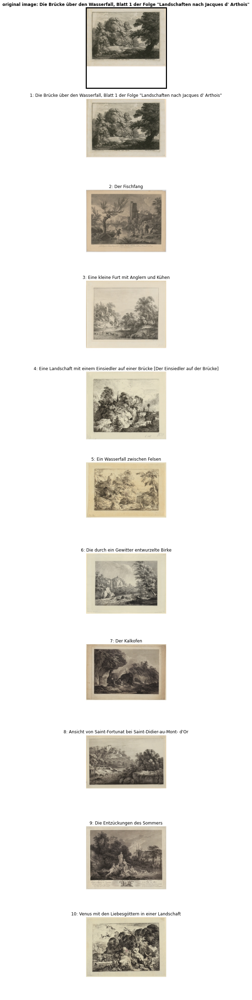

1 :  https://www.graphikportal.org/document/gpo00219134?medium=28B42177
2 :  https://www.graphikportal.org/document/gpo00215500?medium=74C214A
3 :  https://www.graphikportal.org/document/gpo00217614?medium=7732155
4 :  https://www.graphikportal.org/document/gpo00222053?medium=28D72182
5 :  https://www.graphikportal.org/document/gpo00222621?medium=28E52189
6 :  https://www.graphikportal.org/document/gpo00223324?medium=28E12186
7 :  https://www.graphikportal.org/document/gpo00217015?medium=781215F
8 :  https://www.graphikportal.org/document/gpo00217624?medium=77A2158
9 :  https://www.graphikportal.org/document/gpo00217283?medium=7662150
10 :  https://www.graphikportal.org/document/gpo00219580?medium=28B92179


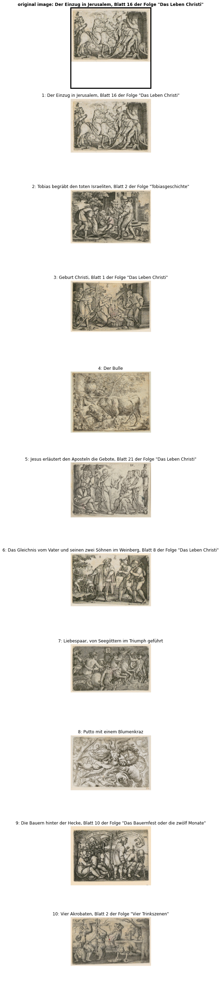

1 :  https://www.graphikportal.org/document/gpo00220727?medium=28B72176
2 :  https://www.graphikportal.org/document/gpo00220784?medium=28CA2181
3 :  https://www.graphikportal.org/document/gpo00219787?medium=28C2217C
4 :  https://www.graphikportal.org/document/gpo00216421?medium=755214A
5 :  https://www.graphikportal.org/document/gpo00226022?medium=28BE2179
6 :  https://www.graphikportal.org/document/gpo00222332?medium=28E7218C
7 :  https://www.graphikportal.org/document/gpo00224524?medium=28D82180
8 :  https://www.graphikportal.org/document/gpo00223004?medium=28D52181
9 :  https://www.graphikportal.org/document/gpo00221679?medium=28D62183
10 :  https://www.graphikportal.org/document/gpo00220221?medium=28C4217A


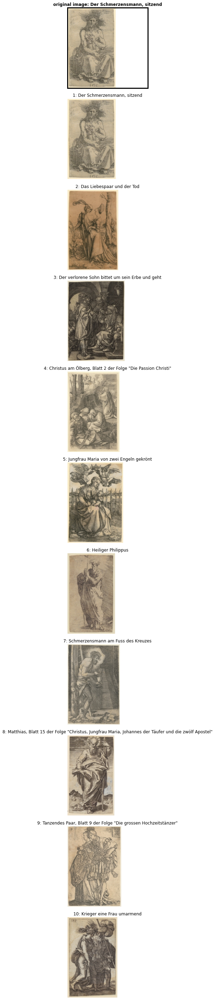

1 :  https://www.graphikportal.org/document/gpo00220805?medium=28C1217D
2 :  https://www.graphikportal.org/document/gpo00232175?medium=28CF217B
3 :  https://www.graphikportal.org/document/gpo00219748?medium=28C4217D
4 :  https://www.graphikportal.org/document/gpo00226115?medium=28B32176
5 :  https://www.graphikportal.org/document/gpo00220558?medium=28D52181
6 :  https://www.graphikportal.org/document/gpo00222963?medium=28CF2181
7 :  https://www.graphikportal.org/document/gpo00227114?medium=28C7217F
8 :  https://www.graphikportal.org/document/gpo00215448?medium=74E214E
9 :  https://www.graphikportal.org/document/gpo00228019?medium=28C12179
10 :  https://www.graphikportal.org/document/gpo00223412?medium=28EA218C


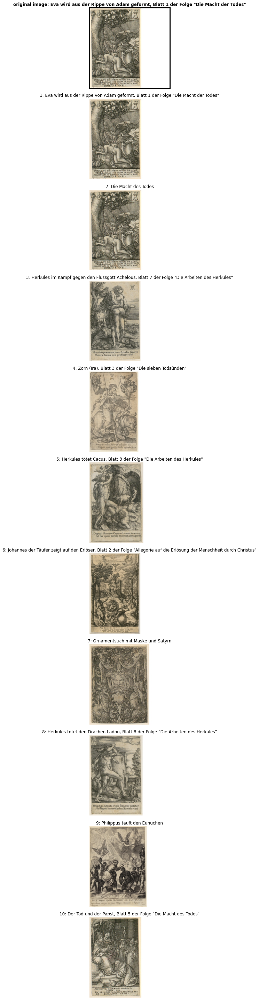

1 :  https://www.graphikportal.org/document/gpo00222539?medium=28E8218B
2 :  https://www.graphikportal.org/document/gpo00221597?medium=28C6217D
3 :  https://www.graphikportal.org/document/gpo00219502?medium=28BD2179
4 :  https://www.graphikportal.org/document/gpo00227250?medium=28C1217A
5 :  https://www.graphikportal.org/document/gpo00222346?medium=28D62181
6 :  https://www.graphikportal.org/document/gpo00220793?medium=28B92176
7 :  https://www.graphikportal.org/document/gpo00219389?medium=28BE217D
8 :  https://www.graphikportal.org/document/gpo00220219?medium=28C32179
9 :  https://www.graphikportal.org/document/gpo00217562?medium=77A2158
10 :  https://www.graphikportal.org/document/gpo00220491?medium=28CD217D


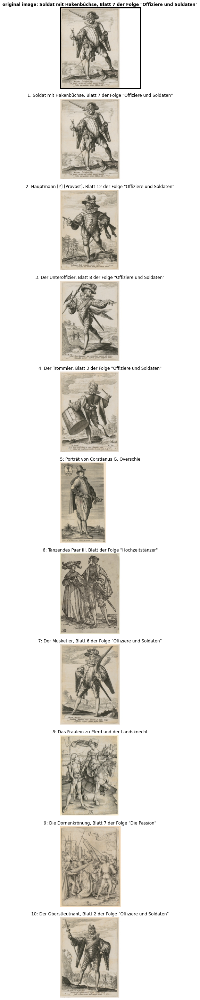

1 :  https://www.graphikportal.org/document/gpo00222833?medium=28D12183
2 :  https://www.graphikportal.org/document/gpo00225807?medium=28EE2187
3 :  https://www.graphikportal.org/document/gpo00225728?medium=28F2218D
4 :  https://www.graphikportal.org/document/gpo00222392?medium=28E62188
5 :  https://www.graphikportal.org/document/gpo00219875?medium=28C0217D
6 :  https://www.graphikportal.org/document/gpo00226970?medium=28D62184
7 :  https://www.graphikportal.org/document/gpo00224400?medium=28DB2182
8 :  https://www.graphikportal.org/document/gpo00220421?medium=28D02181
9 :  https://www.graphikportal.org/document/gpo00219445?medium=28B12176
10 :  https://www.graphikportal.org/document/gpo00226095?medium=29002192


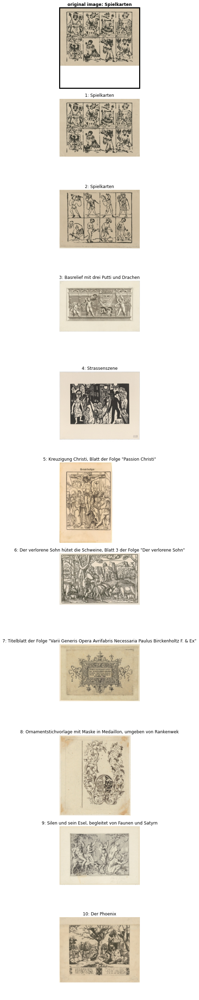

1 :  https://www.graphikportal.org/document/gpo00226354?medium=28CD217E
2 :  https://www.graphikportal.org/document/gpo00215352?medium=7562150
3 :  https://www.graphikportal.org/document/gpo00226586?medium=28C2217E
4 :  https://www.graphikportal.org/document/gpo00215841?medium=76B2156
5 :  https://www.graphikportal.org/document/gpo00226506?medium=28BD2179
6 :  https://www.graphikportal.org/document/gpo00220565?medium=28CE2180
7 :  https://www.graphikportal.org/document/gpo00222630?medium=28C5217B
8 :  https://www.graphikportal.org/document/gpo00220302?medium=28D02180
9 :  https://www.graphikportal.org/document/gpo00225957?medium=28EA2184
10 :  https://www.graphikportal.org/document/gpo00225949?medium=28BD217B


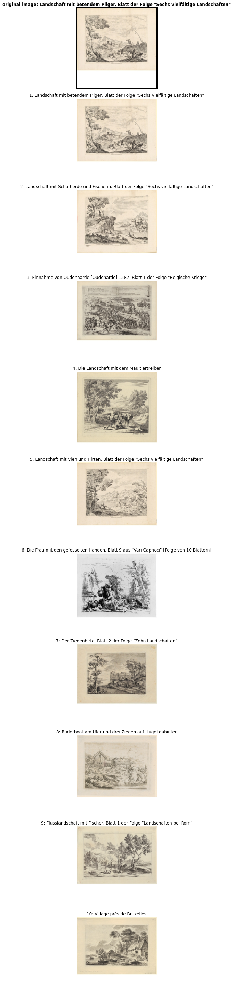

1 :  https://www.graphikportal.org/document/gpo00226378?medium=28E6218A
2 :  https://www.graphikportal.org/document/gpo00226366?medium=28E32187
3 :  https://www.graphikportal.org/document/gpo00221721?medium=28D92183
4 :  https://www.graphikportal.org/document/gpo00218863?medium=28C2217D
5 :  https://www.graphikportal.org/document/gpo00226373?medium=28E42188
6 :  https://www.graphikportal.org/document/gpo00218304?medium=28D0217F
7 :  https://www.graphikportal.org/document/gpo00215710?medium=74B2147
8 :  https://www.graphikportal.org/document/gpo00220954?medium=28D0217E
9 :  https://www.graphikportal.org/document/gpo00222186?medium=28DC2182
10 :  https://www.graphikportal.org/document/gpo00216949?medium=7742159


In [37]:
for j in test_ids:
    object_ids, true_metadata = plot_similar_images(j, 
                                                    df, 
                                                    labels, 
                                                    features_list, 
                                                    clf, 
                                                    clf.kneighbors, 
                                                    show_plots=True, 
                                                    save_figures=True)

In [ ]:

# Perform PCA over the features
num_feature_dimensions=100      # Set the number of features
pca = PCA(n_components = num_feature_dimensions)
pca.fit(feature_list)
feature_list_compressed = pca.transform(featureList)

# For speed and clarity, we'll analyze about first half of the dataset.
selected_features = feature_list_compressed[:4000]
selected_class_ids = class_ids[:4000]
selected_filenames = filenames[:4000]

tsne_results =
TSNE(n_components=2,verbose=1,metric='euclidean')
    .fit_transform(selected_features)

# Plot a scatter plot from the generated t-SNE results
colormap = plt.cm.get_cmap('coolwarm')
scatter_plot = plt.scatter(tsne_results[:,0],tsne_results[:,1], c =
               selected_class_ids, cmap=colormap)
plt.colorbar(scatter_plot)
plt.show()